In [1]:
!pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.3 MB/s eta 0:00:00


In [2]:
!pip install qrcode

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 3.2 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import umap
import matplotlib.pyplot as plt
from itertools import product  # For creating parameter grid
from scipy.stats import gaussian_kde
import plotly.graph_objects as go
import seaborn as sns
import qrcode

In [5]:
# Import the sample containing also the original labels
df = pd.read_csv('/content/sample_with_labels.csv')
df.fillna(0, inplace=True)

# Temporarily remove 'user_uid'
features_df = df.drop(columns=['user_uid', 'label_pred_desc'])

features_df = pd.DataFrame(features_df, columns=df.columns.drop(['user_uid', 'label_pred_desc']))

In [ ]:
# Tuning of UMAP with euclidean distance as dissimilarity measure and plotting

# Define parameter ranges
n_neighbors_range = [5, 20, 80, 320]  # Values for n_neighbors used in McInnes et al.
min_dist_range = [0.0125, 0.05, 0.2, 0.8]  # Values for min_dist used in McInnes et al.

# Create parameter grid
parameter_grid = list(product(n_neighbors_range, min_dist_range))


data = features_df.values

# Initialize a dictionary to store embeddings and parameters
umap_results = {}

# Iterate over all parameter combinations
for n_neighbors, min_dist in parameter_grid:
    print(f"Processing UMAP with n_neighbors={n_neighbors}, min_dist={min_dist}")
    # Initialize UMAP with current parameters
    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components= 2, metric ='euclidean',  random_state=24)

    # Fit and transform the data
    embedding = reducer.fit_transform(data)

    # Store the results
    key = f"n_neighbors={n_neighbors}_min_dist={min_dist}"
    umap_results[key] = embedding



In [ ]:
# Extracting specific UMAP DataFrames from the dictionary
# Access the UMAP embeddings by their correct keys based on the desired parameter combinations
UMAP_5_0125 = pd.DataFrame(umap_results['n_neighbors=5_min_dist=0.0125'], columns=['UMAP1', 'UMAP2'])
UMAP_5_05 = pd.DataFrame(umap_results['n_neighbors=5_min_dist=0.05'], columns=['UMAP1', 'UMAP2'])
UMAP_5_2 = pd.DataFrame(umap_results['n_neighbors=5_min_dist=0.2'], columns=['UMAP1', 'UMAP2'])
UMAP_5_8 = pd.DataFrame(umap_results['n_neighbors=5_min_dist=0.8'], columns=['UMAP1', 'UMAP2'])
UMAP_20_0125 = pd.DataFrame(umap_results['n_neighbors=20_min_dist=0.0125'], columns=['UMAP1', 'UMAP2'])
UMAP_20_05 = pd.DataFrame(umap_results['n_neighbors=20_min_dist=0.05'], columns=['UMAP1', 'UMAP2'])
UMAP_20_2 = pd.DataFrame(umap_results['n_neighbors=20_min_dist=0.2'], columns=['UMAP1', 'UMAP2'])
UMAP_20_8 = pd.DataFrame(umap_results['n_neighbors=20_min_dist=0.8'], columns=['UMAP1', 'UMAP2'])
UMAP_80_0125 = pd.DataFrame(umap_results['n_neighbors=80_min_dist=0.0125'], columns=['UMAP1', 'UMAP2'])
UMAP_80_05 = pd.DataFrame(umap_results['n_neighbors=80_min_dist=0.05'], columns=['UMAP1', 'UMAP2'])
UMAP_80_2 = pd.DataFrame(umap_results['n_neighbors=80_min_dist=0.2'], columns=['UMAP1', 'UMAP2'])
UMAP_80_8 = pd.DataFrame(umap_results['n_neighbors=80_min_dist=0.8'], columns=['UMAP1', 'UMAP2'])
UMAP_320_0125 = pd.DataFrame(umap_results['n_neighbors=320_min_dist=0.0125'], columns=['UMAP1', 'UMAP2'])
UMAP_320_05 = pd.DataFrame(umap_results['n_neighbors=320_min_dist=0.05'], columns=['UMAP1', 'UMAP2'])
UMAP_320_2 = pd.DataFrame(umap_results['n_neighbors=320_min_dist=0.2'], columns=['UMAP1', 'UMAP2'])
UMAP_320_8 = pd.DataFrame(umap_results['n_neighbors=320_min_dist=0.8'], columns=['UMAP1', 'UMAP2'])

# Saving each UMAP DataFrame as a CSV file
UMAP_5_0125.to_csv('UMAP_5_0125.csv', index=False)
UMAP_5_05.to_csv('UMAP_5_05.csv', index=False)
UMAP_5_2.to_csv('UMAP_5_2.csv', index=False)
UMAP_5_8.to_csv('UMAP_5_8.csv', index=False)
UMAP_20_0125.to_csv('UMAP_20_0125.csv', index=False)
UMAP_20_05.to_csv('UMAP_20_05.csv', index=False)
UMAP_20_2.to_csv('UMAP_20_2.csv', index=False)
UMAP_20_8.to_csv('UMAP_20_8.csv', index=False)
UMAP_80_0125.to_csv('UMAP_80_0125.csv', index=False)
UMAP_80_05.to_csv('UMAP_80_05.csv', index=False)
UMAP_80_2.to_csv('UMAP_80_2.csv', index=False)
UMAP_80_8.to_csv('UMAP_80_8.csv', index=False)
UMAP_320_0125.to_csv('UMAP_320_0125.csv', index=False)
UMAP_320_05.to_csv('UMAP_320_05.csv', index=False)
UMAP_320_2.to_csv('UMAP_320_2.csv', index=False)
UMAP_320_8.to_csv('UMAP_320_8.csv', index=False)

In [ ]:
# Define the parameter grid
n_neighbors_range = [5, 20, 80, 320]
min_dist_range = [0.0125, 0.05, 0.2, 0.8]
parameter_grid = list(product(n_neighbors_range, min_dist_range))

# Initialize the umap_results dictionary
umap_results = {}

# Iterate over the parameter grid to reconstruct the dictionary
for n_neighbors, min_dist in parameter_grid:
    # Construct the file name based on the pattern
    file_name = f"UMAP_{n_neighbors}_{str(min_dist).replace('.', '')}.csv"

    # Read the CSV file directly (assuming files are in the current directory in Colab)
    try:
        df = pd.read_csv(file_name)
        # Convert to numpy array and add to the dictionary
        umap_results[f"n_neighbors={n_neighbors}_min_dist={min_dist}"] = df.to_numpy()
    except FileNotFoundError:
        print(f"File not found: {file_name}")

# The umap_results dictionary is now reconstructed

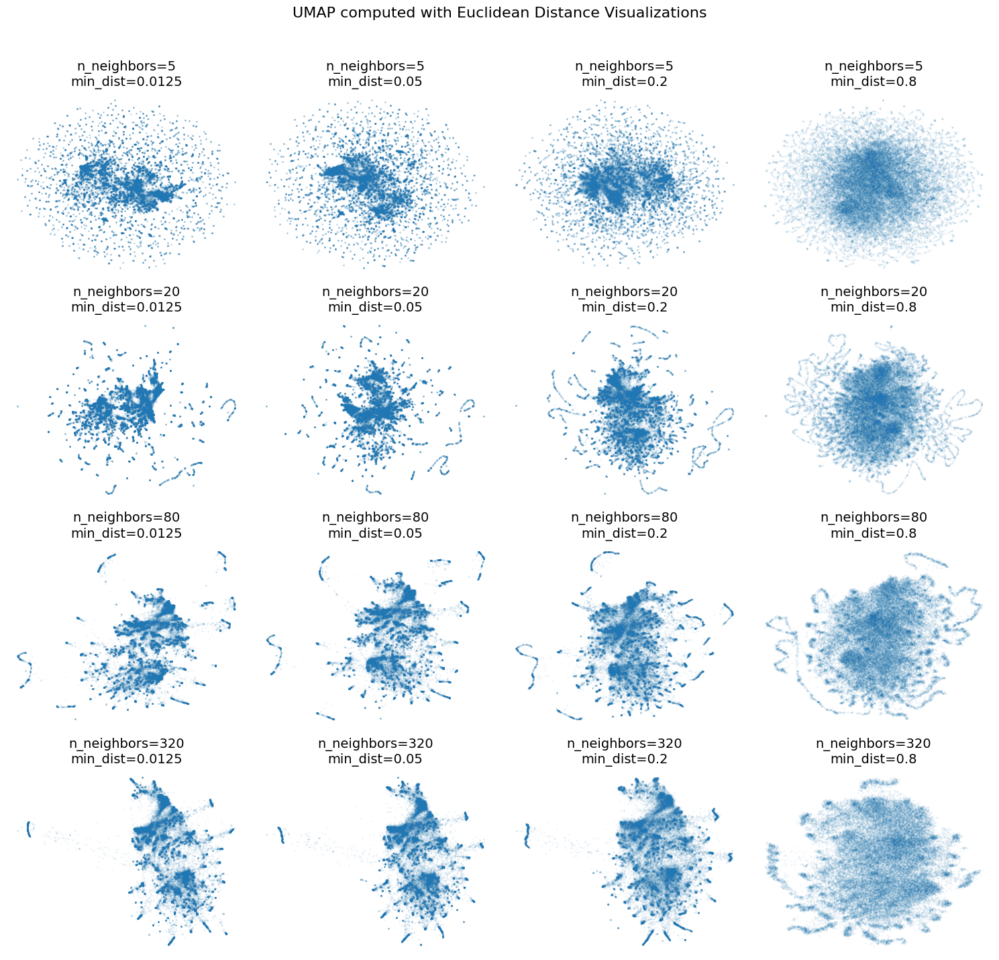

In [ ]:
# Visualize embeddings for each parameter combination
fig, axes = plt.subplots(len(n_neighbors_range), len(min_dist_range), figsize=(15, 15))

for idx, (n_neighbors, min_dist) in enumerate(parameter_grid):
    # Determine subplot position
    row = idx // len(min_dist_range)
    col = idx % len(min_dist_range)

    # Plot the embedding
    embedding = umap_results[f"n_neighbors={n_neighbors}_min_dist={min_dist}"]
    ax = axes[row, col]
    ax.scatter(embedding[:, 0], embedding[:, 1], s=1, alpha=0.05)
    ax.set_title(f"n_neighbors={n_neighbors}\nmin_dist={min_dist}", fontsize=14)  # Increased fontsize
    ax.axis('off')

# Add a general title for the entire facet grid
fig.suptitle("UMAP computed with Euclidean Distance Visualizations", fontsize=16, y=0.95)

plt.tight_layout(rect=[0, 0, 1, 0.93])  # Adjust layout to leave space for the suptitle
plt.show()


In [ ]:
# Tuning of UMAP with cosine distance as dissimilarity measure and plotting

# Define parameter ranges
n_neighbors_range = [5, 20, 80, 320]  # Values for n_neighbors used in McInnes et al.
min_dist_range = [0.0125, 0.05, 0.2, 0.8]  # Values for min_dist used in McInnes et al.

# Create parameter grid
parameter_grid = list(product(n_neighbors_range, min_dist_range))


data = features_df.values

# Initialize a dictionary to store embeddings and parameters
umap_results_1 = {}

# Iterate over all parameter combinations
for n_neighbors, min_dist in parameter_grid:
    print(f"Processing UMAP with n_neighbors={n_neighbors}, min_dist={min_dist}")
    # Initialize UMAP with current parameters
    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components= 2, metric ='cosine',  random_state=24)

    # Fit and transform the data
    embedding = reducer.fit_transform(data)

    # Store the results
    key = f"n_neighbors={n_neighbors}_min_dist={min_dist}"
    umap_results_1[key] = embedding



In [ ]:
# Extracting specific UMAP DataFrames from the dictionary
# Access the UMAP embeddings by their correct keys based on the desired parameter combinations
UMAP_5_0125_cos = pd.DataFrame(umap_results_1['n_neighbors=5_min_dist=0.0125'], columns=['UMAP1', 'UMAP2'])
UMAP_5_05_cos = pd.DataFrame(umap_results_1['n_neighbors=5_min_dist=0.05'], columns=['UMAP1', 'UMAP2'])
UMAP_5_2_cos = pd.DataFrame(umap_results_1['n_neighbors=5_min_dist=0.2'], columns=['UMAP1', 'UMAP2'])
UMAP_5_8_cos = pd.DataFrame(umap_results_1['n_neighbors=5_min_dist=0.8'], columns=['UMAP1', 'UMAP2'])
UMAP_20_0125_cos = pd.DataFrame(umap_results_1['n_neighbors=20_min_dist=0.0125'], columns=['UMAP1', 'UMAP2'])
UMAP_20_05_cos = pd.DataFrame(umap_results_1['n_neighbors=20_min_dist=0.05'], columns=['UMAP1', 'UMAP2'])
UMAP_20_2_cos = pd.DataFrame(umap_results_1['n_neighbors=20_min_dist=0.2'], columns=['UMAP1', 'UMAP2'])
UMAP_20_8_cos = pd.DataFrame(umap_results_1['n_neighbors=20_min_dist=0.8'], columns=['UMAP1', 'UMAP2'])
UMAP_80_0125_cos = pd.DataFrame(umap_results_1['n_neighbors=80_min_dist=0.0125'], columns=['UMAP1', 'UMAP2'])
UMAP_80_05_cos = pd.DataFrame(umap_results_1['n_neighbors=80_min_dist=0.05'], columns=['UMAP1', 'UMAP2'])
UMAP_80_2_cos = pd.DataFrame(umap_results_1['n_neighbors=80_min_dist=0.2'], columns=['UMAP1', 'UMAP2'])
UMAP_80_8_cos = pd.DataFrame(umap_results_1['n_neighbors=80_min_dist=0.8'], columns=['UMAP1', 'UMAP2'])
UMAP_320_0125_cos = pd.DataFrame(umap_results_1['n_neighbors=320_min_dist=0.0125'], columns=['UMAP1', 'UMAP2'])
UMAP_320_05_cos = pd.DataFrame(umap_results_1['n_neighbors=320_min_dist=0.05'], columns=['UMAP1', 'UMAP2'])
UMAP_320_2_cos = pd.DataFrame(umap_results_1['n_neighbors=320_min_dist=0.2'], columns=['UMAP1', 'UMAP2'])
UMAP_320_8_cos = pd.DataFrame(umap_results_1['n_neighbors=320_min_dist=0.8'], columns=['UMAP1', 'UMAP2'])

# Saving each UMAP DataFrame as a CSV file
UMAP_5_0125_cos.to_csv('UMAP_5_0125_cos.csv', index=False)
UMAP_5_05_cos.to_csv('UMAP_5_05_cos.csv', index=False)
UMAP_5_2_cos.to_csv('UMAP_5_2_cos.csv', index=False)
UMAP_5_8_cos.to_csv('UMAP_5_8_cos.csv', index=False)
UMAP_20_0125_cos.to_csv('UMAP_20_0125_cos.csv', index=False)
UMAP_20_05_cos.to_csv('UMAP_20_05_cos.csv', index=False)
UMAP_20_2_cos.to_csv('UMAP_20_2_cos.csv', index=False)
UMAP_20_8_cos.to_csv('UMAP_20_8_cos.csv', index=False)
UMAP_80_0125_cos.to_csv('UMAP_80_0125_cos.csv', index=False)
UMAP_80_05_cos.to_csv('UMAP_80_05_cos.csv', index=False)
UMAP_80_2_cos.to_csv('UMAP_80_2_cos.csv', index=False)
UMAP_80_8_cos.to_csv('UMAP_80_8_cos.csv', index=False)
UMAP_320_0125_cos.to_csv('UMAP_320_0125_cos.csv', index=False)
UMAP_320_05_cos.to_csv('UMAP_320_05_cos.csv', index=False)
UMAP_320_2_cos.to_csv('UMAP_320_2_cos.csv', index=False)
UMAP_320_8_cos.to_csv('UMAP_320_8_cos.csv', index=False)


In [ ]:

# Define the parameter grid
n_neighbors_range = [5, 20, 80, 320]
min_dist_range = [0.0125, 0.05, 0.2, 0.8]
parameter_grid = list(product(n_neighbors_range, min_dist_range))

# Initialize the umap_results_1 dictionary
umap_results_1 = {}

# Iterate over the parameter grid to reconstruct the dictionary
for n_neighbors, min_dist in parameter_grid:
    # Construct the file name based on the pattern
    file_name = f"UMAP_{n_neighbors}_{str(min_dist).replace('.', '')}_cos.csv"

    # Read the CSV file directly (assuming files are in the current directory in Colab)
    try:
        df = pd.read_csv(file_name)
        # Convert to numpy array and add to the dictionary
        key = f"n_neighbors={n_neighbors}_min_dist={min_dist}"
        umap_results_1[key] = df.to_numpy()
    except FileNotFoundError:
        print(f"File not found: {file_name}")

# The umap_results_1 dictionary is now reconstructed with '_cos' appended to dataset names


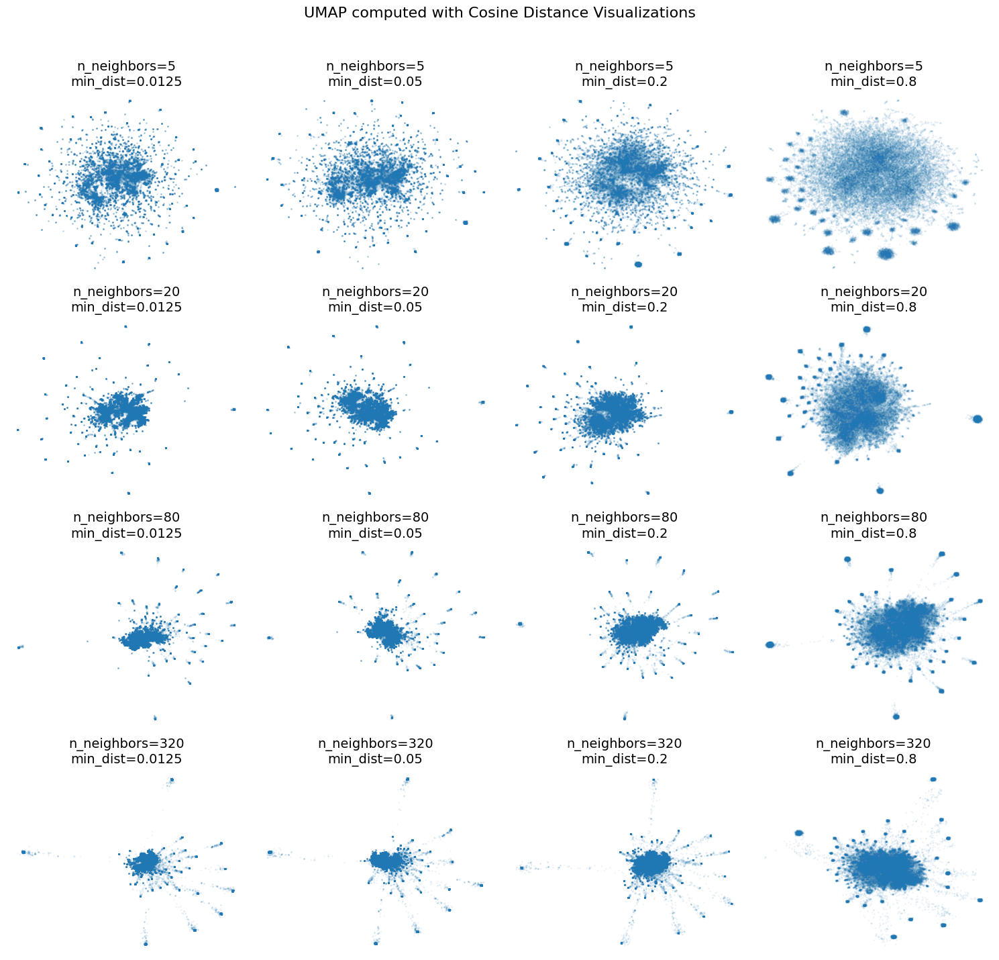

In [ ]:
# Visualize embeddings for each parameter combination
fig, axes = plt.subplots(len(n_neighbors_range), len(min_dist_range), figsize=(15, 15))

for idx, (n_neighbors, min_dist) in enumerate(parameter_grid):
    # Determine subplot position
    row = idx // len(min_dist_range)
    col = idx % len(min_dist_range)

    # Plot the embedding
    embedding = umap_results_1[f"n_neighbors={n_neighbors}_min_dist={min_dist}"]
    ax = axes[row, col]
    ax.scatter(embedding[:, 0], embedding[:, 1], s=1, alpha=0.05)
    ax.set_title(f"n_neighbors={n_neighbors}\nmin_dist={min_dist}", fontsize=14)
    ax.axis('off')

# Add a general title for the entire facet grid
fig.suptitle("UMAP computed with Cosine Distance Visualizations", fontsize=16, y=0.95)

plt.tight_layout(rect=[0, 0, 1, 0.93])  # Adjust layout to leave space for the suptitle
plt.show()


In [ ]:
columns_to_add = ['user_uid', 'label_pred_desc']

# Check if df contains the required columns
if all(col in df.columns for col in columns_to_add):
    for key in umap_results:
        # Convert the numpy array back to a DataFrame
        umap_df = pd.DataFrame(umap_results[key], columns=['UMAP1', 'UMAP2'])

        # Add the specified columns from df
        umap_df[columns_to_add[0]] = df[columns_to_add[0]].values
        umap_df[columns_to_add[1]] = df[columns_to_add[1]].values

        # Convert back to numpy array if needed, or leave as DataFrame
        umap_results[key] = umap_df  # Keep as DataFrame for easier use later
else:
    print("The specified columns are not present in the provided dataset.")


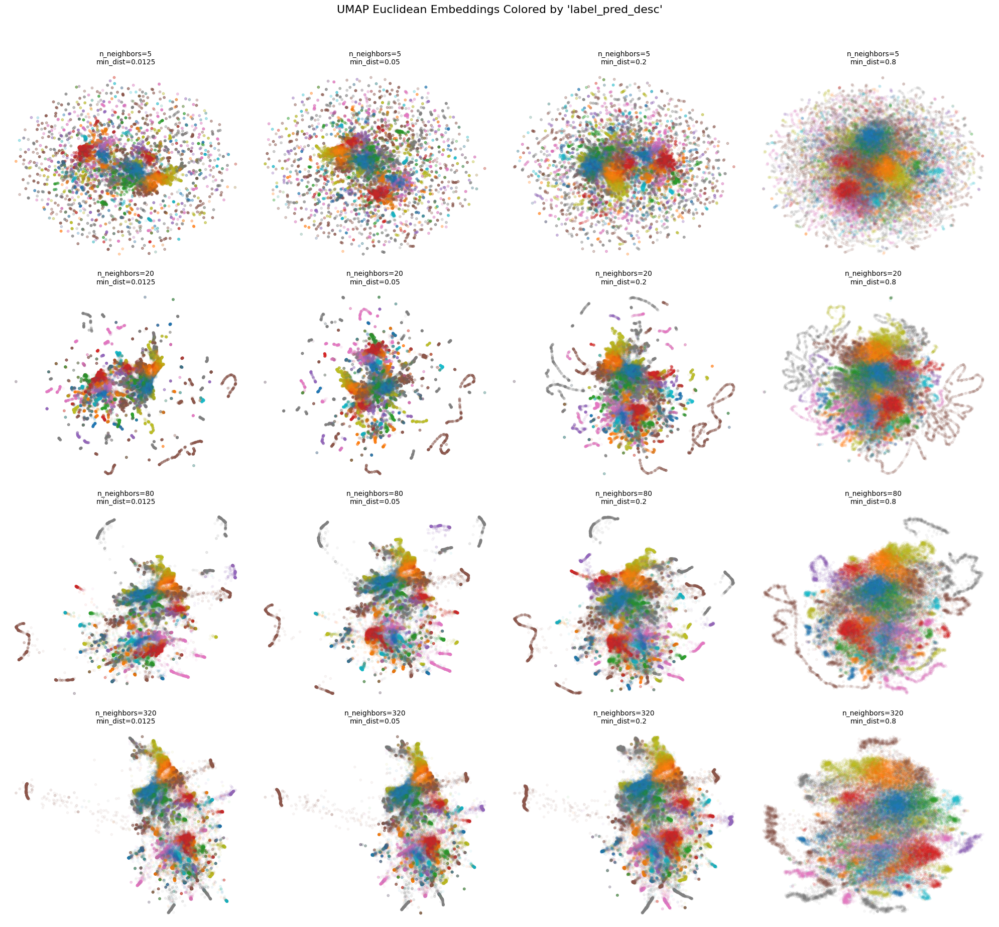

In [ ]:
# Map string labels in 'label_pred_desc' to numeric values
label_mapping = {label: idx for idx, label in enumerate(umap_df['label_pred_desc'].unique())}

# Visualize embeddings for each parameter combination
fig, axes = plt.subplots(len(n_neighbors_range), len(min_dist_range), figsize=(20, 20))
fig.suptitle("UMAP Euclidean Embeddings Colored by 'label_pred_desc'", fontsize=16, y=0.92)

for idx, (n_neighbors, min_dist) in enumerate(parameter_grid):
    # Determine subplot position
    row = idx // len(min_dist_range)
    col = idx % len(min_dist_range)

    # Access the embedding DataFrame
    key = f"n_neighbors={n_neighbors}_min_dist={min_dist}"
    umap_df = umap_results[key]

    # Map string labels to numeric values for color
    color = umap_df['label_pred_desc'].map(label_mapping)

    # Extract UMAP coordinates
    x, y = umap_df['UMAP1'], umap_df['UMAP2']

    # Plot the embedding
    ax = axes[row, col]
    ax.scatter(x, y, c=color, cmap='tab10', s=10, alpha=0.05)  # Use tab10 colormap for discrete labels
    ax.set_title(f"n_neighbors={n_neighbors}\nmin_dist={min_dist}", fontsize=10)
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.9])  # Leave space for the suptitle
plt.show()


In [ ]:

columns_to_add = ['user_uid', 'label_pred_desc']

# Check if df contains the required columns
if all(col in df.columns for col in columns_to_add):
    for key in umap_results_1:
        # Convert the numpy array back to a DataFrame
        umap_df = pd.DataFrame(umap_results_1[key], columns=['UMAP1', 'UMAP2'])

        # Add the specified columns from df
        umap_df[columns_to_add[0]] = df[columns_to_add[0]].values
        umap_df[columns_to_add[1]] = df[columns_to_add[1]].values

        # Convert back to numpy array if needed, or leave as DataFrame
        umap_results_1[key] = umap_df  # Keep as DataFrame for easier use later
else:
    print("The specified columns are not present in the provided dataset.")


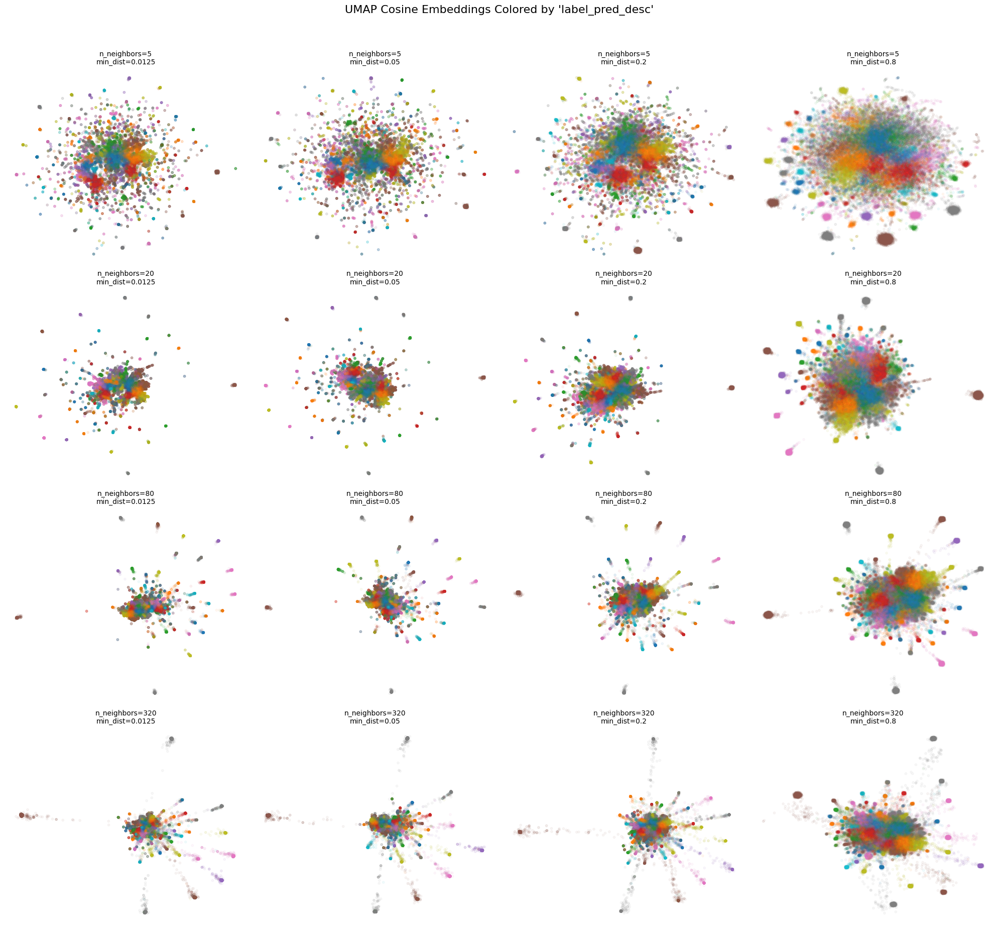

In [ ]:
# Map string labels in 'label_pred_desc' to numeric values
label_mapping = {label: idx for idx, label in enumerate(umap_df['label_pred_desc'].unique())}

# Visualize embeddings for each parameter combination
fig, axes = plt.subplots(len(n_neighbors_range), len(min_dist_range), figsize=(20, 20))
fig.suptitle("UMAP Cosine Embeddings Colored by 'label_pred_desc'", fontsize=16, y=0.92)

for idx, (n_neighbors, min_dist) in enumerate(parameter_grid):
    # Determine subplot position
    row = idx // len(min_dist_range)
    col = idx % len(min_dist_range)

    # Access the embedding DataFrame
    key = f"n_neighbors={n_neighbors}_min_dist={min_dist}"
    umap_df = umap_results_1[key]

    # Map string labels to numeric values for color
    color = umap_df['label_pred_desc'].map(label_mapping)

    # Extract UMAP coordinates
    x, y = umap_df['UMAP1'], umap_df['UMAP2']

    # Plot the embedding
    ax = axes[row, col]
    ax.scatter(x, y, c=color, cmap='tab10', s=10, alpha=0.05)  # Use tab10 colormap for discrete labels
    ax.set_title(f"n_neighbors={n_neighbors}\nmin_dist={min_dist}", fontsize=10)
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.9])  # Leave space for the suptitle
plt.show()



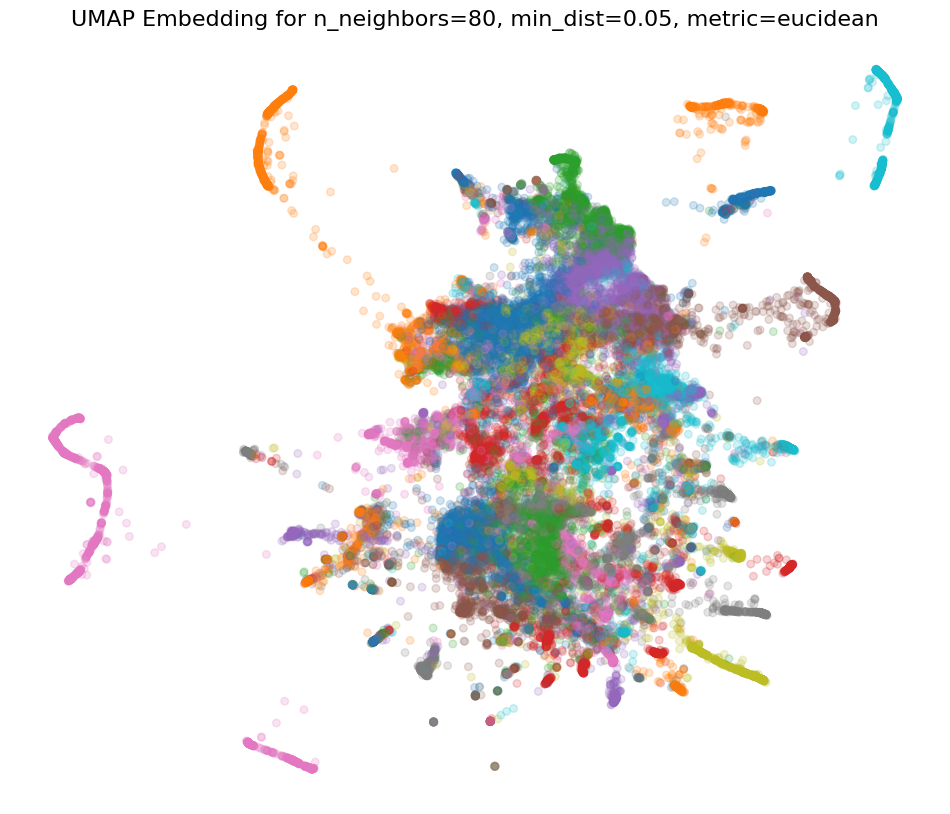

In [ ]:

# Load the UMAP embedding data
umap_df = pd.read_csv('/content/umap_euclidean.csv')
umap_df['label_pred_desc'] = df['label_pred_desc'].reset_index(drop=True)

# Map string labels in 'label_pred_desc' to numeric values for coloring
label_mapping = {label: idx for idx, label in enumerate(umap_df['label_pred_desc'].unique())}
color = umap_df['label_pred_desc'].map(label_mapping)

# Extract UMAP coordinates
x, y = umap_df['UMAP1'], umap_df['UMAP2']

# Set the color palette (same colors as used in facet grid)
palette = sns.color_palette("tab10", n_colors=10)  # Use 'tab10' for up to 10 distinct colors
# If you need to generate more distinct colors, you can repeat the palette or use other palettes like 'tab20', 'tab20b'

# Ensure we have 28 distinct colors by repeating the 'tab10' palette to cover all clusters
repeated_palette = palette * (28 // len(palette)) + palette[:28 % len(palette)]  # Repeat the colors to match 28 clusters

# Plot the embedding
plt.figure(figsize=(12, 10))

# Plot the scatter plot with distinct colors for each cluster
scatter = plt.scatter(x, y, c=color, cmap=plt.cm.colors.ListedColormap(repeated_palette), s=30, alpha=0.2)

# Set plot title and axis labels
plt.title("UMAP Embedding for n_neighbors=80, min_dist=0.05, metric=eucidean", fontsize=16)
plt.xlabel("UMAP 1", fontsize=14)
plt.ylabel("UMAP 2", fontsize=14)

# Customize the plot for better aesthetics
plt.axis('off')  # Hide axes for a cleaner look
plt.show()


In [ ]:
# Initialize UMAP with current parameters
reducer = umap.UMAP(n_neighbors= 80, min_dist= 0.05, n_components= 3, metric ='euclidean')

# Fit and transform the data
UMAP_euc_3d = reducer.fit_transform(features_df)

# Convert UMAP result to a DataFrame
UMAP_euc_3d_df = pd.DataFrame(UMAP_euc_3d, columns=[f'UMAP_{i+1}' for i in range(UMAP_euc_3d.shape[1])])

# Add additional columns from the original DataFrame
UMAP_euc_3d_df['user_uid'] = df['user_uid'].reset_index(drop=True)
UMAP_euc_3d_df['label_pred_desc'] = df['label_pred_desc'].reset_index(drop=True)

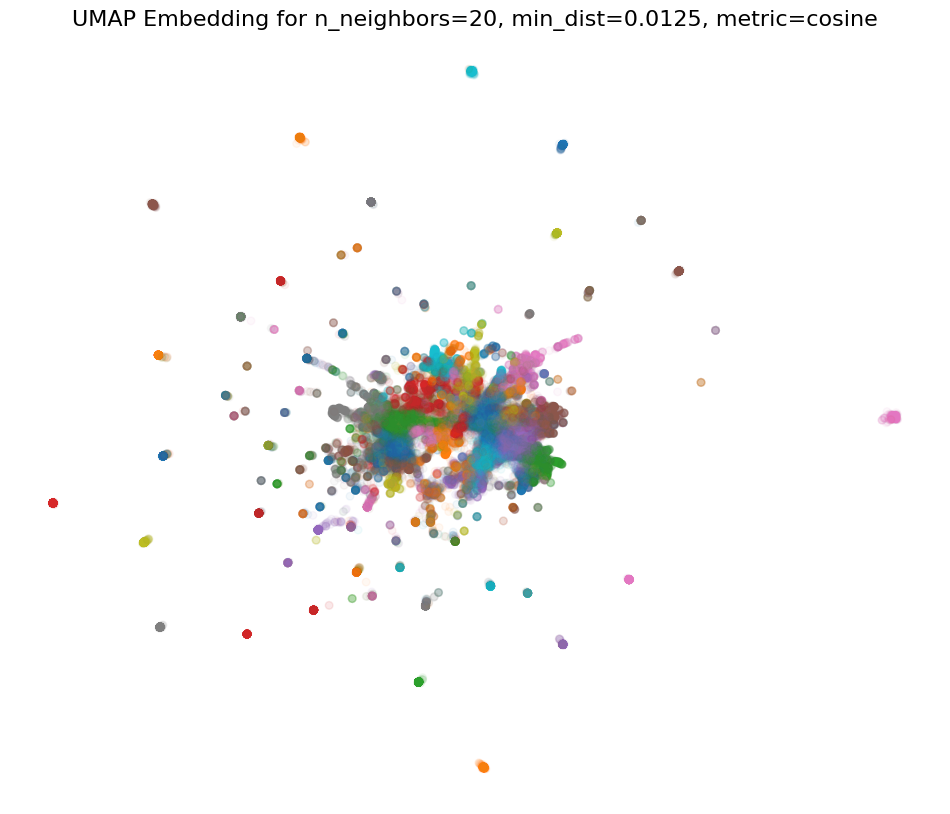

In [ ]:
# Load the UMAP embedding data
umap_df = pd.read_csv('/content/umap_cosine.csv')
umap_df['label_pred_desc'] = df['label_pred_desc'].reset_index(drop=True)

# Map string labels in 'label_pred_desc' to numeric values for coloring
label_mapping = {label: idx for idx, label in enumerate(umap_df['label_pred_desc'].unique())}
color = umap_df['label_pred_desc'].map(label_mapping)

# Extract UMAP coordinates
x, y = umap_df['UMAP1'], umap_df['UMAP2']

# Set the color palette (same colors as used in facet grid)
palette = sns.color_palette("tab10", n_colors=10)  # Use 'tab10' for up to 10 distinct colors
# If you need to generate more distinct colors, you can repeat the palette or use other palettes like 'tab20', 'tab20b'

# Ensure we have 28 distinct colors by repeating the 'tab10' palette to cover all clusters
repeated_palette = palette * (28 // len(palette)) + palette[:28 % len(palette)]  # Repeat the colors to match 28 clusters

# Plot the embedding
plt.figure(figsize=(12, 10))

# Plot the scatter plot with distinct colors for each cluster
scatter = plt.scatter(x, y, c=color, cmap=plt.cm.colors.ListedColormap(repeated_palette), s=30, alpha=0.05)


# Set plot title and axis labels
plt.title("UMAP Embedding for n_neighbors=20, min_dist=0.0125, metric=cosine", fontsize=16)
plt.xlabel("UMAP 1", fontsize=14)
plt.ylabel("UMAP 2", fontsize=14)

# Customize the plot for better aesthetics
plt.axis('off')  # Hide axes for a cleaner look
plt.show()


In [ ]:
# Initialize UMAP with current parameters
reducer = umap.UMAP(n_neighbors= 20, min_dist= 0.0125, n_components= 3, metric ='cosine')

# Fit and transform the data
UMAP_cos_3d = reducer.fit_transform(features_df)

# Convert UMAP result to a DataFrame
UMAP_cos_3d_df = pd.DataFrame(UMAP_cos_3d, columns=[f'UMAP_{i+1}' for i in range(UMAP_cos_3d.shape[1])])

# Add additional columns from the original DataFrame
UMAP_cos_3d_df['user_uid'] = df['user_uid'].reset_index(drop=True)
UMAP_cos_3d_df['cluster'] = df['label_pred_desc'].reset_index(drop=True)

In [ ]:
# Initialize UMAP with current parameters
reducer = umap.UMAP(n_neighbors= 80, min_dist= 0.05, n_components= 50, metric ='euclidean')

# Fit and transform the data
UMAP_highdim = reducer.fit_transform(features_df)

# Convert UMAP result to a DataFrame
UMAP_highdim = pd.DataFrame(UMAP_highdim, columns=[f'UMAP_{i+1}' for i in range(UMAP_highdim.shape[1])])

# Add additional columns from the original DataFrame
UMAP_highdim['user_uid'] = df['user_uid'].reset_index(drop=True)
UMAP_highdim['cluster'] = df['label_pred_desc'].reset_index(drop=True)

UMAP_highdim.to_csv('UMAP_highdim.csv', index=False)

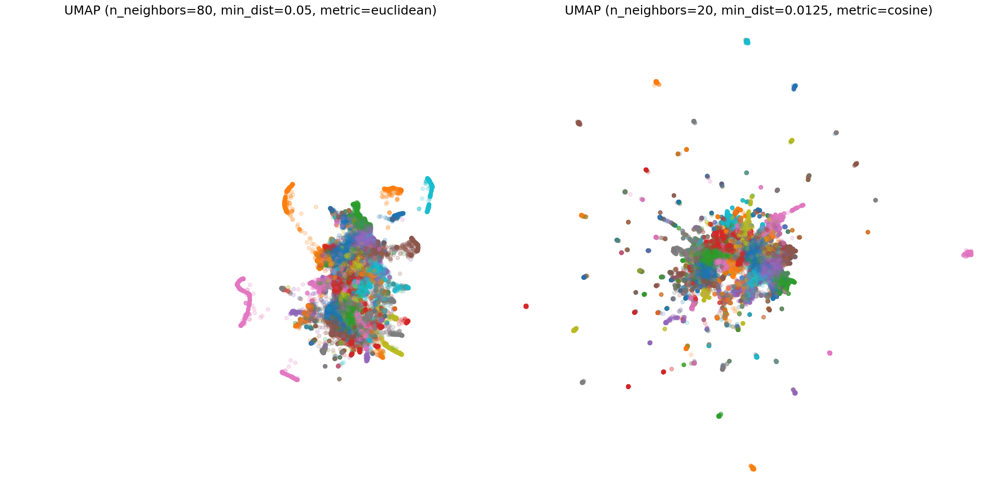

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

# Load the UMAP embedding data for both cosine and euclidean metrics
umap_euclidean = pd.read_csv('/content/umap_euclidean.csv')
umap_cosine = pd.read_csv('/content/umap_cosine.csv')

# Ensure labels match
umap_euclidean['label_pred_desc'] = df['label_pred_desc'].reset_index(drop=True)
umap_cosine['label_pred_desc'] = df['label_pred_desc'].reset_index(drop=True)

# Map string labels to numeric values for coloring
label_mapping_euclidean = {label: idx for idx, label in enumerate(umap_euclidean['label_pred_desc'].unique())}
label_mapping_cosine = {label: idx for idx, label in enumerate(umap_cosine['label_pred_desc'].unique())}

umap_euclidean['color'] = umap_euclidean['label_pred_desc'].map(label_mapping_euclidean)
umap_cosine['color'] = umap_cosine['label_pred_desc'].map(label_mapping_cosine)

# Define the color palette
palette = sns.color_palette("tab10", n_colors=10)
repeated_palette = palette * (28 // len(palette)) + palette[:28 % len(palette)]  # Extend palette for up to 28 clusters

# Create the combined facet plot
fig, axes = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)

# Plot Euclidean UMAP
scatter1 = axes[0].scatter(
    umap_euclidean['UMAP1'],
    umap_euclidean['UMAP2'],
    c=umap_euclidean['color'],
    cmap=ListedColormap(repeated_palette),
    s=30, alpha=0.2
)
axes[0].set_title("UMAP (n_neighbors=80, min_dist=0.05, metric=euclidean)", fontsize=18)
axes[0].axis('off')

# Plot Cosine UMAP
scatter2 = axes[1].scatter(
    umap_cosine['UMAP1'],
    umap_cosine['UMAP2'],
    c=umap_cosine['color'],
    cmap=ListedColormap(repeated_palette),
    s=30, alpha=0.2
)
axes[1].set_title("UMAP (n_neighbors=20, min_dist=0.0125, metric=cosine)", fontsize=18)
axes[1].axis('off')

# Add a legend (optional)
plt.tight_layout()
plt.show()

In [ ]:
# Create the 3D scatter plot
fig = go.Figure()

# Custom colors for categorical data
custom_colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
    '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
    '#8b4513', '#00ced1', '#ff1493', '#ff4500', '#ffd700',
    '#32cd32', '#ff6347', '#40e0d0', '#adff2f', '#800080',
    '#ff8c00', '#c71585', '#f4a460', '#00fa9a', '#dc143c',
    '#d2691e', '#5f9ea0'
]

UMAP_df = UMAP_euc_3d_df
UMAP_df['cluster'] = UMAP_df['label_pred_desc'].astype('category')

# Add a 3D scatter plot for the DataFrame
scatter = go.Scatter3d(
    x=UMAP_df['UMAP_1'], y=UMAP_df['UMAP_2'], z=UMAP_df['UMAP_3'],
    mode='markers',
    marker=dict(
        size=4,  # Slightly larger size for better visibility
        color=UMAP_df['cluster'].cat.codes,  # Color based on 'cluster' category codes
        colorscale=custom_colors,  # Categorical colorscale
        opacity=0.5  # Higher opacity to emphasize denser areas
    ),
    name="UMAP Plot"
)

# Add the trace to the figure
fig.add_trace(scatter)

# Update layout for a responsive plot
fig.update_layout(
    autosize=True,  # Allow dynamic resizing
    showlegend=False,
    title_text="3D UMAP Plot (n_neighbors=80, min_dist=0.05, metric=euclidean)",  # Title for the plot
    title_font=dict(size=24, color="white"),  # Title styling
    paper_bgcolor="black",  # Background outside the 3D plot
    scene=dict(
        xaxis=dict(
            title="",  # Removed axis name
            backgroundcolor="black",
            gridcolor="black",  # Same color as background to hide grid
            showline=False,  # Disable axis lines
            zeroline=False,  # Disable zero line
            title_font=dict(color="white"),
            tickfont=dict(color="white"),
            showticklabels=False  # Hide tick labels for a cleaner look
        ),
        yaxis=dict(
            title="",  # Removed axis name
            backgroundcolor="black",
            gridcolor="black",  # Same color as background to hide grid
            showline=False,  # Disable axis lines
            zeroline=False,  # Disable zero line
            title_font=dict(color="white"),
            tickfont=dict(color="white"),
            showticklabels=False  # Hide tick labels for a cleaner look
        ),
        zaxis=dict(
            title="",  # Removed axis name
            backgroundcolor="black",
            gridcolor="black",  # Same color as background to hide grid
            showline=False,  # Disable axis lines
            zeroline=False,  # Disable zero line
            title_font=dict(color="white"),
            tickfont=dict(color="white"),
            showticklabels=False  # Hide tick labels for a cleaner look
        ),
        aspectmode="cube"  # Equal aspect ratio for x, y, z
    )
)

# Display the plot
fig.show()

# Save the figure as a responsive HTML file
fig.write_html("UMAP_3d_euc_plot.html", include_plotlyjs='cdn')


In [ ]:


# Replace with your Google Drive direct link
direct_link = "https://drive.google.com/file/d/1cH9veEx0SbwPi4Hjbk6BI1jo037vJbfI/view?usp=drive_link"

# Generate QR Code
qr = qrcode.QRCode(
    version=1,
    error_correction=qrcode.constants.ERROR_CORRECT_L,
    box_size=10,
    border=4,
)
qr.add_data(direct_link)
qr.make(fit=True)

# Create and save the QR code image
img = qr.make_image(fill_color="black", back_color="white")
img.save("google_drive_qr_code_euc.png")


In [ ]:
# Create the 3D scatter plot
fig = go.Figure()

# Custom colors for categorical data
custom_colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
    '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
    '#8b4513', '#00ced1', '#ff1493', '#ff4500', '#ffd700',
    '#32cd32', '#ff6347', '#40e0d0', '#adff2f', '#800080',
    '#ff8c00', '#c71585', '#f4a460', '#00fa9a', '#dc143c',
    '#d2691e', '#5f9ea0'
]

UMAP_df = UMAP_cos_3d_df
UMAP_df['cluster'] = UMAP_df['cluster'].astype('category')

# Add a 3D scatter plot for the DataFrame
scatter = go.Scatter3d(
    x=UMAP_df['UMAP_1'], y=UMAP_df['UMAP_2'], z=UMAP_df['UMAP_3'],
    mode='markers',
    marker=dict(
        size=4,  # Slightly larger size for better visibility
        color=UMAP_df['cluster'].cat.codes,  # Color based on 'cluster' category codes
        colorscale=custom_colors,  # Categorical colorscale
        opacity=0.5  # Higher opacity to emphasize denser areas
    ),
    name="UMAP Plot"
)

# Add the trace to the figure
fig.add_trace(scatter)

# Update layout for a responsive plot
fig.update_layout(
    autosize=True,  # Allow dynamic resizing
    showlegend=False,
    title_text="3D UMAP Plot (n_neighbors=20, min_dist=0.0125, metric=cosine)",  # Title for the plot
    title_font=dict(size=24, color="white"),  # Title styling
    paper_bgcolor="black",  # Background outside the 3D plot
    scene=dict(
        xaxis=dict(
            title="",  # Removed axis name
            backgroundcolor="black",
            gridcolor="black",  # Same color as background to hide grid
            showline=False,  # Disable axis lines
            zeroline=False,  # Disable zero line
            title_font=dict(color="white"),
            tickfont=dict(color="white"),
            showticklabels=False  # Hide tick labels for a cleaner look
        ),
        yaxis=dict(
            title="",  # Removed axis name
            backgroundcolor="black",
            gridcolor="black",  # Same color as background to hide grid
            showline=False,  # Disable axis lines
            zeroline=False,  # Disable zero line
            title_font=dict(color="white"),
            tickfont=dict(color="white"),
            showticklabels=False  # Hide tick labels for a cleaner look
        ),
        zaxis=dict(
            title="",  # Removed axis name
            backgroundcolor="black",
            gridcolor="black",  # Same color as background to hide grid
            showline=False,  # Disable axis lines
            zeroline=False,  # Disable zero line
            title_font=dict(color="white"),
            tickfont=dict(color="white"),
            showticklabels=False  # Hide tick labels for a cleaner look
        ),
        aspectmode="cube"  # Equal aspect ratio for x, y, z
    )
)

# Display the plot
fig.show()

# Save the figure as a responsive HTML file
fig.write_html("UMAP_3d_cos_plot.html", include_plotlyjs='cdn')


In [ ]:
# Replace with your Google Drive direct link
direct_link = "https://drive.google.com/file/d/1_3RVmLbXOV2FOnOdH-e7AzVBytHa109C/view?usp=drive_link"

# Generate QR Code
qr = qrcode.QRCode(
    version=1,
    error_correction=qrcode.constants.ERROR_CORRECT_L,
    box_size=10,
    border=4,
)
qr.add_data(direct_link)
qr.make(fit=True)

# Create and save the QR code image
img = qr.make_image(fill_color="black", back_color="white")
img.save("google_drive_qr_code_cos.png")


In [ ]:
# Replace with your Google Drive direct link
direct_link = "https://drive.google.com/drive/folders/1Qgz8OPjlma_55vsVcPXl2t7hTzPfkffV?usp=drive_link"

# Generate QR Code
qr = qrcode.QRCode(
    version=1,
    error_correction=qrcode.constants.ERROR_CORRECT_L,
    box_size=10,
    border=4,
)
qr.add_data(direct_link)
qr.make(fit=True)

# Create and save the QR code image
img = qr.make_image(fill_color="black", back_color="white")
img.save("google_drive_qr_code_folder.png")


In [6]:
# Initialize UMAP with current parameters
reducer = umap.UMAP(n_neighbors= 80, min_dist= 0.05, n_components= 2, metric ='euclidean')

# Fit and transform the data
UMAP_euclidean = reducer.fit_transform(features_df)

# Convert UMAP result to a DataFrame
UMAP_euclidean = pd.DataFrame(UMAP_euclidean, columns=[f'UMAP_{i+1}' for i in range(UMAP_euclidean.shape[1])])

# Add additional columns from the original DataFrame
UMAP_euclidean['user_uid'] = df['user_uid'].reset_index(drop=True)
UMAP_euclidean['original_labels'] = df['label_pred_desc'].reset_index(drop=True)

UMAP_euclidean.to_csv('UMAP_euclidean.csv', index=False)

In [7]:
# Initialize UMAP with current parameters
reducer = umap.UMAP(n_neighbors= 20, min_dist= 0.0125, n_components= 2, metric ='cosine')

# Fit and transform the data
UMAP_cosine = reducer.fit_transform(features_df)

# Convert UMAP result to a DataFrame
UMAP_cosine = pd.DataFrame(UMAP_cosine, columns=[f'UMAP_{i+1}' for i in range(UMAP_cosine.shape[1])])

# Add additional columns from the original DataFrame
UMAP_cosine['user_uid'] = df['user_uid'].reset_index(drop=True)
UMAP_cosine['original_labels'] = df['label_pred_desc'].reset_index(drop=True)

UMAP_cosine.to_csv('UMAP_cosine.csv', index=False)

In [8]:
# Initialize UMAP with current parameters
reducer = umap.UMAP(n_neighbors= 80, min_dist= 0.05, n_components= 50, metric ='euclidean')

# Fit and transform the data
UMAP_highdim = reducer.fit_transform(features_df)

# Convert UMAP result to a DataFrame
UMAP_highdim = pd.DataFrame(UMAP_highdim, columns=[f'UMAP_{i+1}' for i in range(UMAP_highdim.shape[1])])

# Add additional columns from the original DataFrame
UMAP_highdim['user_uid'] = df['user_uid'].reset_index(drop=True)
UMAP_highdim['original_labels'] = df['label_pred_desc'].reset_index(drop=True)

UMAP_highdim.to_csv('UMAP_highdim.csv', index=False)